# Modelling with Pipelines

![Status](https://img.shields.io/static/v1.svg?label=Status&message=Finished&color=brightgreen)
[![Source](https://img.shields.io/static/v1.svg?label=GitHub&message=Source&color=181717&logo=GitHub)](https://github.com/particle1331/inefficient-networks/blob/master/docs/notebooks/fundamentals/pipelines.ipynb)
[![Stars](https://img.shields.io/github/stars/particle1331/inefficient-networks?style=social)](https://github.com/particle1331/inefficient-networks)

```text
𝗔𝘂𝘁𝗵𝗼𝗿: Ron Medina
𝗟𝗮𝘀𝘁 𝗠𝗼𝗱𝗶𝗳𝗶𝗲𝗱: 2022/07/03
𝗗𝗲𝘀𝗰𝗿𝗶𝗽𝘁𝗶𝗼𝗻: Modelling using scikit-learn pipelines.
```

---

## Introduction

Pipelines in the [`scikit-learn` API](https://scikit-learn.org/stable/modules/classes.html#) allow us to apply a sequence of transformers and a final estimator on our dataset. Since each intermediate step implements a `fit` and `transform` method, while the final estimator implements a `fit` method, this setup allows us to recursively fit of all transformations on the dataset in a single step. Another advantage is that the pipeline can be cross-validated as a whole while setting different parameters. 

From the perspective of code maintainability and testability, pipelines are easier to work with because they allow us to separate declarative from imperative code as shown in {numref}`pipelines`. In the last section of this notebook, we will show that we can easily load pipelines to make inference on test data with little to no preprocessing.

```{figure} ../../img/pipelines.png
---
width: 40em
name: pipelines
---
Pipelines allow us to cleanly separate declarative from imperative code. [[source]](https://gh.mltrainings.ru/presentations/LopuhinJankiewicz_KaggleMercari.pdf)
```


## House prices dataset

In this notebook, we will use the dataset from the [House Prices - Advanced](https://www.kaggle.com/c/house-prices-advanced-regression-techniques) competition in Kaggle. This is a dataset with 79 features describing almost every aspect of residential homes in Ames, Iowa. We will use these features to predict the final price of each home.

Downloading the dataset:

```bash
COMPETITION=house-prices-advanced-regression-techniques
DATA_DIR=./data
mkdir ${DATA_DIR}
kaggle competitions download -c ${COMPETITION} -p ${DATA_DIR}
unzip ${DATA_DIR}/${COMPETITION}.zip -d ${DATA_DIR}/${COMPETITION} > /dev/null
rm ${DATA_DIR}/${COMPETITION}.zip
```

```tex
Downloading house-prices-advanced-regression-techniques.zip to ./data
100%|███████| 199k/199k [00:00<00:00, 1.67MB/s]
100%|███████| 199k/199k [00:00<00:00, 1.66MB/s]
```

Loading the data:

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from matplotlib_inline import backend_inline
backend_inline.set_matplotlib_formats('svg')


data = pd.read_csv('data/house-prices-advanced-regression-techniques/train.csv')
data.drop(['Id'], axis=1, inplace=True)

print(data.shape)
data.head()

(1460, 80)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [2]:
data.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'Wo

Identifying categorical and numerical features:

In [3]:
categorical = [f for f in data.columns if data[f].dtype == 'O'] + ['MSSubClass']
data[categorical] = data[categorical].astype('O')

numerical = [f for f in data.columns if f not in categorical and f != 'SalePrice']

### Target distribution

Normalizing the target distribution:

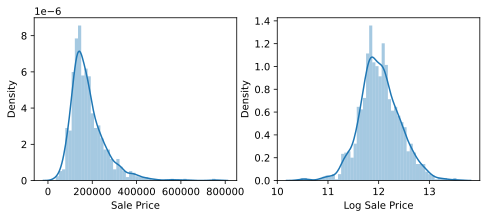

In [4]:
import warnings
warnings.simplefilter(action='ignore')

fig, ax = plt.subplots(1, 2, figsize=(8, 3))

sns.distplot(data.SalePrice.values, bins=50, ax=ax[0])
sns.distplot(np.log(data.SalePrice.values), bins=50, ax=ax[1]);

ax[0].set_xlabel('Sale Price')
ax[1].set_xlabel('Log Sale Price');

Log-transforming the target:

In [5]:
data['LogSalePrice'] = np.log(data['SalePrice'])

### Missing values

Percentage of examples with missing feature:

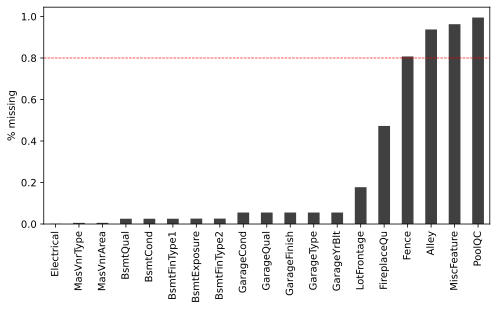

In [6]:
var_with_nan = [v for v in data.columns if data[v].isnull().sum() > 0]
percentage_nan = data[var_with_nan].isnull().mean().sort_values(ascending=True)

# Plot
percentage_nan.plot.bar(figsize=(8, 4), color='#404040')
plt.ylabel('% missing')
plt.axhline(y=0.80, color='#FF0000', linestyle='--', linewidth=0.7)
plt.show()

In [7]:
categorical_na = [v for v in categorical if v in var_with_nan]
numerical_na = [v for v in numerical if v in var_with_nan]

print(f'No. categorical w/ nans: {len(categorical_na)}/{len(categorical)}')
print(f'No. numerical w/ nans:    {len(numerical_na)}/{len(numerical)}')

No. categorical w/ nans: 16/44
No. numerical w/ nans:    3/35


Effect of missingness on sale price:

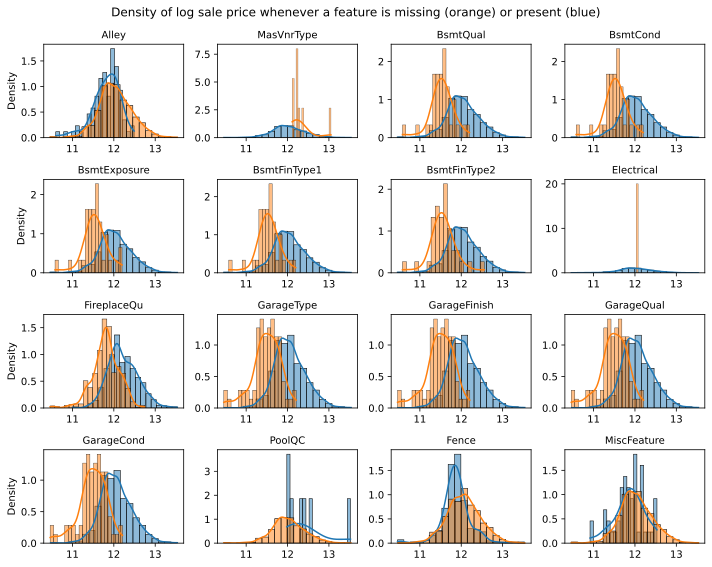

In [8]:
data_ = data.copy()
for v in data_.columns:
    data_[f"{v}_isna"] = data_[v].isna().astype(int)

fig, ax = plt.subplots(4, 4, figsize=(10, 8))
k = 0
for i in range(4):
    for j in range(4):
        sns.histplot(data_.query(f"{categorical_na[k]}_isna == 0").LogSalePrice.values, bins=20, ax=ax[i, j], color="C0", stat="density", kde=True)
        sns.histplot(data_.query(f"{categorical_na[k]}_isna == 1").LogSalePrice.values, bins=20, ax=ax[i, j], color="C1", stat="density", kde=True)
        ax[i, j].set_title(f"{categorical_na[k]}", size=10)
        if j > 0:
            ax[i, j].set_ylabel("")
        k += 1

fig.suptitle("Density of log sale price whenever a feature is missing (orange) or present (blue)")
fig.tight_layout();

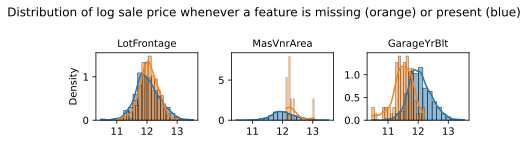

In [9]:
fig, ax = plt.subplots(1, 3, figsize=(6, 2))
k = 0
for i in range(3):
    sns.histplot(data_.query(f"{numerical_na[k]}_isna == 0").LogSalePrice.values, bins=20, ax=ax[i], color="C0", stat="density", kde=True)
    sns.histplot(data_.query(f"{numerical_na[k]}_isna == 1").LogSalePrice.values, bins=20, ax=ax[i], color="C1", stat="density", kde=True)
    ax[i].set_title(f"{numerical_na[k]}", size=10)
    if i > 0:
        ax[i].set_ylabel("")
    k += 1
    
fig.suptitle("Distribution of log sale price whenever a feature is missing (orange) or present (blue)")
fig.tight_layout()

### Temporal features

Get year features:

In [10]:
year_features = [f for f in numerical if 'Yr' in f or 'Year' in f]
year_features

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

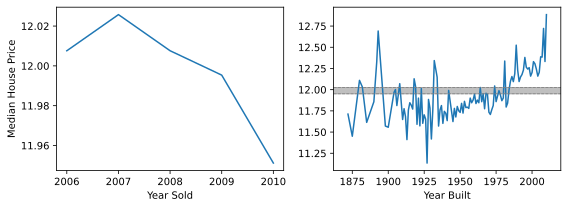

In [11]:
fig, ax = plt.subplots(1, 2, figsize=(8, 3))

price_yrsold = data.groupby('YrSold')['LogSalePrice'].median()
ax[0].plot(price_yrsold)
ax[0].set_xticks(price_yrsold.index.astype(int))
ax[0].set_ylabel('Median House Price')
ax[0].set_xlabel("Year Sold")

price_yrbuilt = data.groupby('YearBuilt')['LogSalePrice'].median()
ax[1].plot(price_yrbuilt)
ax[1].set_ylabel("")
ax[1].set_xlabel("Year Built")
ax[1].axhline(price_yrsold.max(), color='gray', linestyle='dashed', linewidth=0.8)
ax[1].axhline(price_yrsold.min(), color='gray', linestyle='dashed', linewidth=0.8)
ax[1].set_xlim(price_yrbuilt.index.min() - 10, price_yrbuilt.index.max() + 10)
ax[1].fill_between(x=[1800]+list(price_yrbuilt.index)+[2050], y1=price_yrsold.min(), y2=price_yrsold.max(), color='gray', alpha=0.5)

fig.tight_layout()

The range of values of sold houses are plotted in the right plot. This shows that only houses pre-1990s are being sold between 2006 to 2010. Next we plot the average years from making builds on the house (including the initial build) to it being sold. Here we see mostly that houses are being bought within 15 years of these constructions.

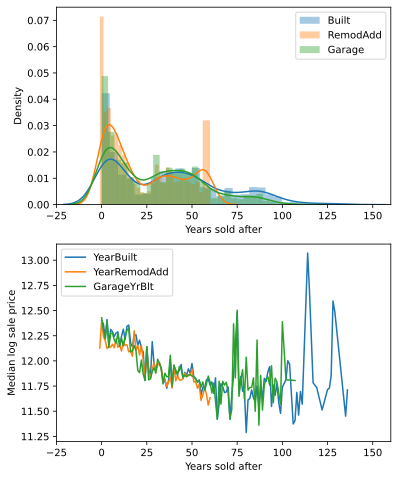

In [12]:
fig, ax = plt.subplots(2, 1, figsize=(6, 8))

sns.distplot(data.YrSold - data.YearBuilt,    ax=ax[0], bins=30, label="Built")
sns.distplot(data.YrSold - data.YearRemodAdd, ax=ax[0], bins=30, label="RemodAdd")
sns.distplot(data.YrSold - data.GarageYrBlt,  ax=ax[0], bins=30, label="Garage")
ax[0].set_xlabel("Years sold after")
ax[0].set_xlim(-25, 160)
ax[0].legend()

median_saleprice = lambda year_var: data_.groupby(f"{year_var}_gap").LogSalePrice.median()

for year_var in ['YearBuilt', 'YearRemodAdd', 'GarageYrBlt']:
    data_[f"{year_var}_gap"] = data.YrSold - data[year_var].values
    ax[1].plot(median_saleprice(year_var), label=year_var)

ax[1].set_xlabel("Years sold after")
ax[1].set_ylabel("Median log sale price")
ax[1].set_xlim(-25, 160)
ax[1].legend();

### Discrete features

For our purposes, we will define discrete variables as numeric variables with less than 20 unique values that are not year variables.

In [13]:
discrete = [v for v in numerical if (data[v].nunique() < 20) and (v not in year_features)]

print('No. discrete features:', len(discrete))
data[discrete].head()

No. discrete features: 13


,OverallQual,OverallCond,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,PoolArea,MoSold
0,7,5,1,0,2,1,3,1,8,0,2,0,2
1,6,8,0,1,2,0,3,1,6,1,2,0,5
2,7,5,1,0,2,1,3,1,6,1,2,0,9
3,7,5,1,0,1,0,3,1,7,1,3,0,2
4,8,5,1,0,2,1,4,1,9,1,3,0,12


These tend to be grading scales. Therefore, we expect increasing trend with `SalePrice`.

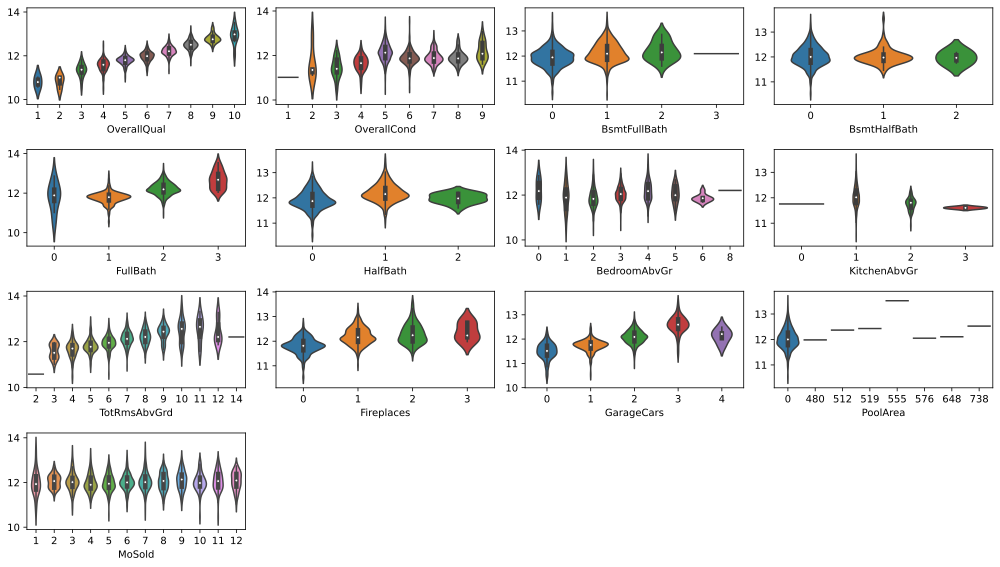

In [14]:
fig, ax = plt.subplots(4, 4, figsize=(14, 8))
k = 0
for i in range(4):
    for j in range(4):
        if k < 13:
            sns.violinplot(ax=ax[i, j], x=discrete[k], y='LogSalePrice', data=data, height=4, aspect=1.5)
            ax[i, j].set_ylabel("")
        else:
            ax[i, j].set_visible(False)
        k += 1

fig.tight_layout()

### Continuous features

For our purposes, continuous features are numerical features that are not years nor discrete.

In [15]:
continuous = [v for v in numerical if v not in discrete + year_features]
print('Number of continuous variables: ', len(continuous))

Number of continuous variables:  18


In [16]:
data[continuous].head()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal
0,65.0,8450,196.0,706,0,150,856,856,854,0,1710,548,0,61,0,0,0,0
1,80.0,9600,0.0,978,0,284,1262,1262,0,0,1262,460,298,0,0,0,0,0
2,68.0,11250,162.0,486,0,434,920,920,866,0,1786,608,0,42,0,0,0,0
3,60.0,9550,0.0,216,0,540,756,961,756,0,1717,642,0,35,272,0,0,0
4,84.0,14260,350.0,655,0,490,1145,1145,1053,0,2198,836,192,84,0,0,0,0


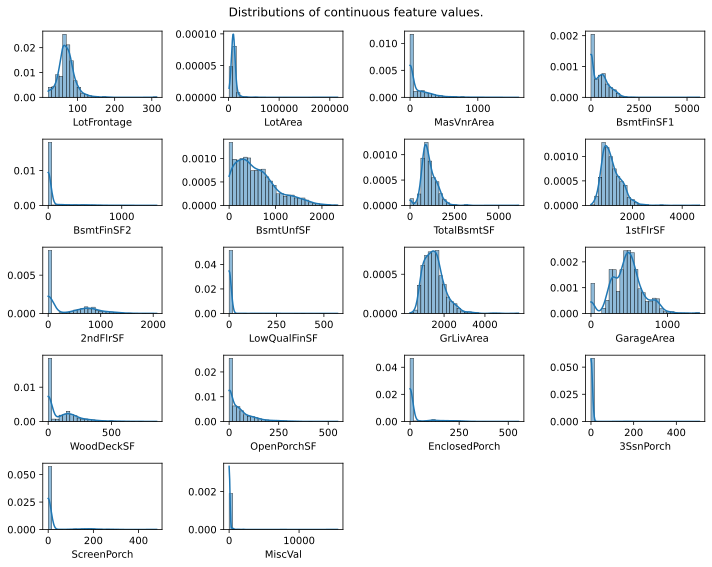

In [17]:
fig, ax = plt.subplots(5, 4, figsize=(10, 8))
k = 0
for i in range(5):
    for j in range(4):
        if k < 18:
            v = continuous[k]
            sns.histplot(ax=ax[i, j], data=data[v], bins=30, stat='density', kde=True)
            ax[i, j].set_ylabel("")
        else:
            ax[i, j].set_visible(False)
        k += 1

fig.suptitle("Distributions of continuous feature values.")
fig.tight_layout()

Note that
* **log-transform** helps data with heavy right tail (i.e. left-skewed). Otherwise, it makes it worse.
* **square-transform** can help make more bell-shaped left-skewed data.
* **Yeo-Johnson** is an automatic [power transforms](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PowerTransformer.html) that supports both negative and positive values.

The data looks mostly left-skewed. We set aside extremely skewed variables for separate analysis.

In [18]:
extreme_skewed = [
    'BsmtFinSF2', 
    'LowQualFinSF', 
    'EnclosedPorch',
    '3SsnPorch', 
    'ScreenPorch', 
    'MiscVal'
]

# Update continuous features
continuous = [c for c in continuous if c not in extreme_skewed]

Checking if Yeo-Johnson works well:

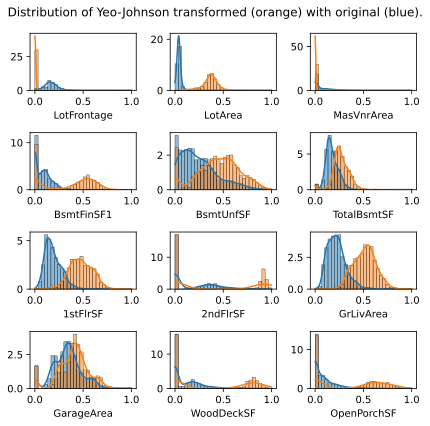

In [19]:
import scipy

def compare_transformed_dist(f, columns, rows, cols):
    data_transformed = data.copy()
    data_orig_scaled = data.copy() # Original data scaled

    for v in columns:
        # Transform the variable using Yeo-Johnson
        data_transformed[v], _ = f(data[v])
        data_transformed[v] = (data_transformed[v] - data_transformed[v].min()) / (data_transformed[v].max() - data_transformed[v].min())  # scale
        data_orig_scaled[v] = (data[v] - data[v].min()) / (data[v].max() - data[v].min()) 

    # Plot the histograms of the transformed variables
    fig, ax = plt.subplots(rows, cols, figsize=(cols * 2.0, rows * 1.5))
    k = 0
    for i in range(rows):
        for j in range(cols):
            if k < rows * cols:
                v = columns[k]
                sns.histplot(ax=ax[i, j], data=data_orig_scaled[v], bins=30, kde=True, stat='density', color="C0");
                sns.histplot(ax=ax[i, j], data=data_transformed[v], bins=30, kde=True, stat='density', color="C1")
                ax[i, j].set_ylabel("")
            else:
                ax[i, j].set_visible(False)
            k += 1

    fig.suptitle("Distribution of Yeo-Johnson transformed (orange) with original (blue).")
    fig.tight_layout()

    return data_transformed, data_orig_scaled


data_transformed, data_orig_scaled = compare_transformed_dist(
    f=scipy.stats.yeojohnson, 
    columns=continuous, rows=4, cols=3
)

For `LotFrontage` and `MasVnrArea` the transformation did not do an amazing job. Otherwise, the distribution looks better. Whether this helps improve the predictive power, remains to be seen. To determine if this is the case, we should train a model with the original values and one with the transformed values, and determine model performance, and feature importance. Here we do a quick visualization.

In [20]:
def compare_transformed_price(data_transformed, data_orig_scaled, columns, rows, cols, row_size=2.5, col_size=3.3):
    # Plot the histograms of the transformed variables
    fig, ax = plt.subplots(rows, cols, figsize=(rows * row_size, cols * col_size))
    k = 0
    for i in range(rows):
        for j in range(cols):
            if k < rows * cols:
                v = columns[k]
                sns.regplot(x=v, y="LogSalePrice", data=data_orig_scaled, ax=ax[i, j], color="C0", label="Original")
                sns.regplot(x=v, y="LogSalePrice", data=data_transformed, ax=ax[i, j], color="C1", label="Transformed", marker='x')
            else:
                ax[i, j].set_visible(False)
            if j > 0:
                ax[i, j].set_ylabel("")
            k += 1

    fig.suptitle("LogSalePrice vs transformed (orange) and original (blue) feature values.")
    fig.tight_layout()

compare_transformed_price(data_transformed, data_orig_scaled, columns=continuous, rows=4, cols=3)

By eye, the transformations seems to improve the relationship only for `LotArea` and `GrLivArea`.

Next try log-transform for features with nonzero values.

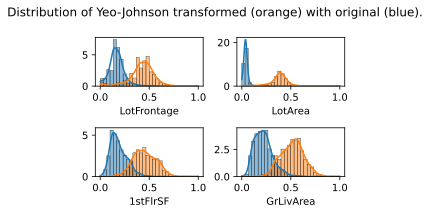

In [21]:
# Need to make log-transform to 2-valued (like Yeo-Johnson)
@np.vectorize
def log(x):
    return np.log(x), 0

positive = [c for c in continuous if data[c].min() > 0]
data_transformed, data_orig_scaled = compare_transformed_dist(
    f=log, 
    columns=positive, rows=2, cols=2
)

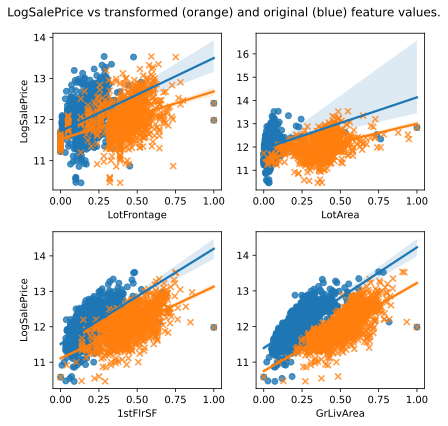

In [22]:
compare_transformed_price(
    data_transformed, data_orig_scaled, 
    columns=positive, rows=2, cols=2,
    row_size=3, col_size=3
)

The transformed variables have a better spread of the values, which may in turn, help make better predictions.

### Extremely skewed variables

These variables are mostly zero:

In [23]:
(data[extreme_skewed] == 0).mean()

BsmtFinSF2       0.885616
LowQualFinSF     0.982192
EnclosedPorch    0.857534
3SsnPorch        0.983562
ScreenPorch      0.920548
MiscVal          0.964384
dtype: float64

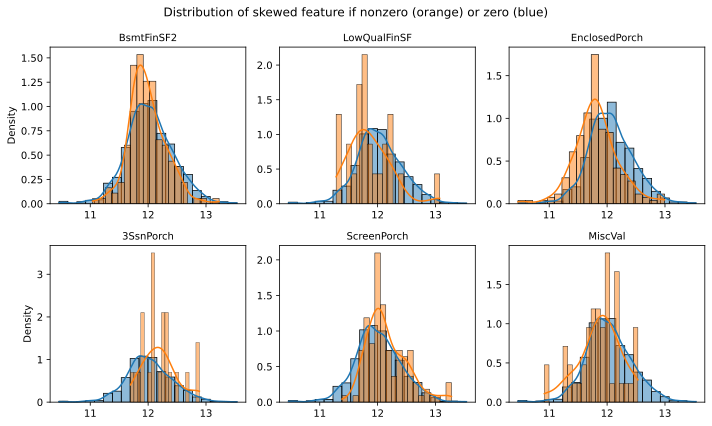

In [24]:
fig, ax = plt.subplots(2, 3, figsize=(10, 6))
k = 0
for i in range(2):
    for j in range(3):
        v = extreme_skewed[k]
        sns.histplot(data[data[v] == 0].LogSalePrice.values, bins=20, ax=ax[i, j], color="C0", stat="density", kde=True)
        sns.histplot(data[data[v] >  0].LogSalePrice.values, bins=20, ax=ax[i, j], color="C1", stat="density", kde=True)
        ax[i, j].set_title(v, size=10)
        if j > 0:
            ax[i, j].set_ylabel("")
        k += 1

fig.suptitle("Distribution of skewed feature if nonzero (orange) or zero (blue)")
fig.tight_layout();

### Categorical variables

In [25]:
print('No. categorical variables: ', len(categorical))

No. categorical variables:  44


In [26]:
data[categorical].head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,MSSubClass
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal,60
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal,20
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal,60
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,...,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml,70
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,...,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal,60


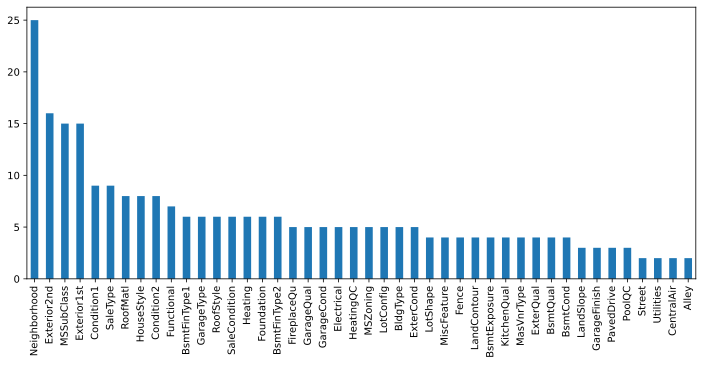

In [27]:
data[categorical].nunique().sort_values(ascending=False).plot.bar(figsize=(12,5));

All the categorical variables show low cardinality, this means that they have only few different labels which is good. The following encodings are hand-crafted based on the metadata. This can be captured automatically using ordered label encoding for example. For example:

```text
FireplaceQu: Fireplace quality

       Ex	Excellent - Exceptional Masonry Fireplace
       Gd	Good - Masonry Fireplace in main level
       TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
       Fa	Fair - Prefabricated Fireplace in basement
       Po	Poor - Ben Franklin Stove
       NA	No Fireplace
```

Applying the mappings:

In [28]:
qual_mappings = {
    'Po': 1, 
    'Fa': 2, 
    'TA': 3, 
    'Gd': 4, 
    'Ex': 5, 
    'Missing': 0, 
    'NA': 0
}

qual_vars = [
    'ExterQual', 
    'ExterCond', 
    'BsmtQual', 
    'BsmtCond',
    'HeatingQC', 
    'KitchenQual', 
    'FireplaceQu',
    'GarageQual', 
    'GarageCond',
]

data_transformed = data.copy()
for v in qual_vars:
    data_transformed[v] = data[v].map(qual_mappings)


# ==============================================================================

exposure_mappings = {
    'No': 1, 
    'Mn': 2, 
    'Av': 3, 
    'Gd': 4, 
    'Missing': 0, 
    'NA': 0
}

for v in ['BsmtExposure']:
    data_transformed[v] = data[v].map(exposure_mappings)


# ==============================================================================

finish_mappings = {
    'Missing': 0, 
    'NA': 0, 
    'Unf': 1, 
    'LwQ': 2, 
    'Rec': 3, 
    'BLQ': 4, 
    'ALQ': 5, 
    'GLQ': 6
}

finish_vars = ['BsmtFinType1', 'BsmtFinType2']
for v in finish_vars:
    data_transformed[v] = data[v].map(finish_mappings)


# ==============================================================================

garage_mappings = {
    'Missing': 0, 
    'NA': 0, 
    'Unf': 1, 
    'RFn': 2, 
    'Fin': 3
}

garage_vars = ['GarageFinish']
for v in garage_vars:
    data_transformed[v] = data[v].map(garage_mappings)


# ==============================================================================

fence_mappings = {
    'Missing': 0, 
    'NA': 0, 
    'MnWw': 1, 
    'GdWo': 2, 
    'MnPrv': 3, 
    'GdPrv': 4
}

fence_vars = ['Fence']
for v in fence_vars:
    data_transformed[v] = data[v].map(fence_mappings)


# ==============================================================================
# All quality variables
quality  = qual_vars + finish_vars + ['BsmtExposure', 'GarageFinish', 'Fence']
print(len(quality))

14


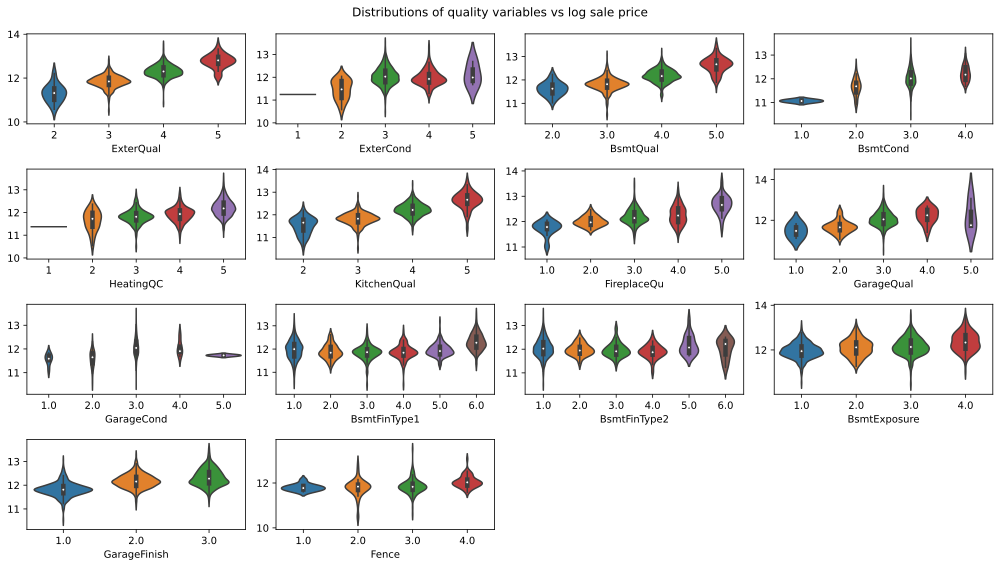

In [29]:
fig, ax = plt.subplots(4, 4, figsize=(14, 8))
k = 0
for i in range(4):
    for j in range(4):
        if k < 14:
            sns.violinplot(
                ax=ax[i, j], 
                x=quality[k], 
                y='LogSalePrice', 
                data=data_transformed, 
                height=4, aspect=1.5
            )
            ax[i, j].set_ylabel("")
        else:
            ax[i, j].set_visible(False)
        k += 1

fig.suptitle("Distributions of quality variables vs log sale price")
fig.tight_layout()

For most attributes, the increase in the house price with the value of the variable is quite clear.

In [30]:
categorical_others = [v for v in categorical if v not in quality]
len(categorical_others)

30

### Rare labels

For our purposes, we define rare as belonging to only 1% of observations.

In [31]:
data_copy = data.copy()
rare_transforms = {}

for v in categorical_others:
    rare_threshold = 0.01
    rare_percentage = data_copy[v].value_counts(normalize=True)
    rare_values = rare_percentage[rare_percentage < rare_threshold]
    
    print(f"Fraction rare: {len(rare_values)}/{data_copy[v].nunique()}")
    print(rare_values)
    print()

    rare_values = list(rare_values.index)
    rare_transforms[v] = dict(zip(rare_values, ['Rare'] * len(rare_values)))
    for u in [_ for _ in data[v].unique() if _ not in rare_values]:
        rare_transforms[v][u] = u

    data_copy[v] = data_copy[v].map(rare_transforms[v])

Fraction rare: 1/5
C (all)    0.006849
Name: MSZoning, dtype: float64

Fraction rare: 1/2
Grvl    0.00411
Name: Street, dtype: float64

Fraction rare: 0/2
Series([], Name: Alley, dtype: float64)

Fraction rare: 1/4
IR3    0.006849
Name: LotShape, dtype: float64

Fraction rare: 0/4
Series([], Name: LandContour, dtype: float64)

Fraction rare: 1/2
NoSeWa    0.000685
Name: Utilities, dtype: float64

Fraction rare: 1/5
FR3    0.00274
Name: LotConfig, dtype: float64

Fraction rare: 1/3
Sev    0.008904
Name: LandSlope, dtype: float64

Fraction rare: 3/25
Veenker    0.007534
NPkVill    0.006164
Blueste    0.001370
Name: Neighborhood, dtype: float64

Fraction rare: 4/9
RRAe    0.007534
PosA    0.005479
RRNn    0.003425
RRNe    0.001370
Name: Condition1, dtype: float64

Fraction rare: 7/8
Feedr     0.004110
Artery    0.001370
RRNn      0.001370
PosN      0.001370
PosA      0.000685
RRAn      0.000685
RRAe      0.000685
Name: Condition2, dtype: float64

Fraction rare: 0/5
Series([], Name: BldgTy

Some of the categorical variables show multiple **rare labels** that are present in less than 1% of the houses. Labels that are under-represented in the dataset tend to cause over-fitting of machine learning models. That is why we want to remove them or collect them in one label `rare`.

Finally, we want to explore the relationship between the categories of the different variables and the house sale price:

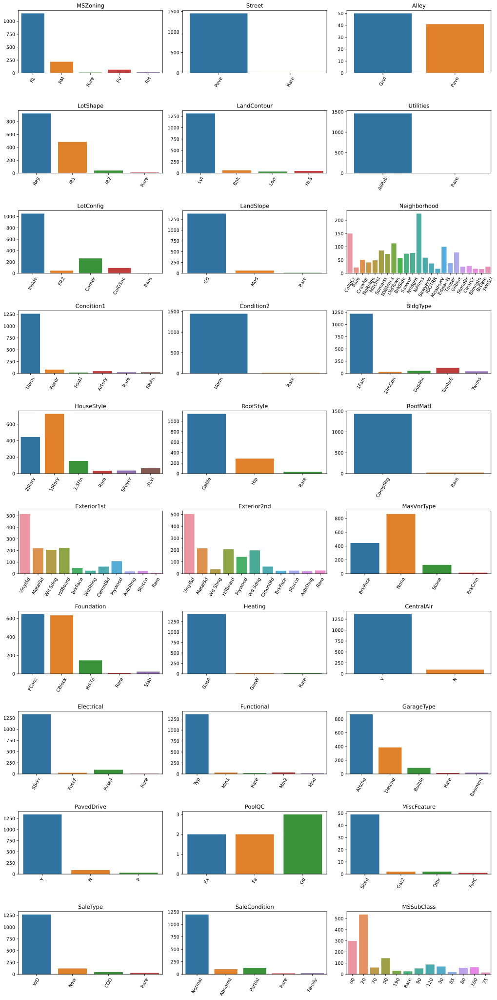

In [50]:
fig, ax = plt.subplots(10, 3, figsize=(15, 30))
k = 0
for i in range(10):
    for j in range(3):
        v = categorical_others[k]
        if k < 30:
            sns.countplot(ax=ax[i, j], x=v, data=data_copy)
            ax[i, j].set_ylabel("")
            ax[i, j].set_xlabel("")
            ax[i, j].set_title(v)
            ax[i, j].tick_params(axis='x', labelrotation=60)
        else:
            ax[i, j].set_visible(False)
        k += 1

fig.tight_layout()